In [45]:
import pandas as pd
import numpy as np
import pandas as pd
import statistics
import os
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
from plotly.offline import init_notebook_mode, iplot, plot
import plotly as py
init_notebook_mode(connected=True)
import plotly.graph_objs as go
import plotly.express as px
import statistics as stat
from scipy.stats import binom
from sklearn.preprocessing import StandardScaler
from matplotlib.patches import Rectangle
# splitting merge_data into train test and split
from sklearn.model_selection import train_test_split, cross_validate
from scipy import stats
from scipy.stats import normaltest
import os 
from sklearn.preprocessing import MinMaxScaler
from sklearn import preprocessing
import matplotlib as mpl
import warnings; warnings.filterwarnings(action='once')
# to keep track of training time
import datetime
# logistic regression model
from sklearn.linear_model import LogisticRegression
# metrics used for evaluation
from sklearn.metrics import f1_score, matthews_corrcoef
# visualizations
from yellowbrick.classifier import ClassPredictionError, ConfusionMatrix
from sklearn.metrics import plot_roc_curve
# KNN imputation
from sklearn.impute import KNNImputer
# normalizer
from sklearn.preprocessing import Normalizer
# variance threshold
from sklearn.feature_selection import VarianceThreshold
# RFECV
from sklearn.model_selection import StratifiedKFold
# random forest
from sklearn.ensemble import RandomForestClassifier
# evaluation metric
from sklearn.metrics import matthews_corrcoef, make_scorer
from scipy import stats 
from sklearn.model_selection import KFold, StratifiedKFold, train_test_split 
from sklearn.model_selection import cross_val_score # Evaluate a score by cross-validation
from sklearn.model_selection import GridSearchCV # Exhaustive search over specified parameter values for an estimator
from sklearn.metrics import classification_report # Build a text report showing the main classification metrics
from sklearn.metrics import accuracy_score # Accuracy classification score
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay # to show confusion matrix
from sklearn import metrics # Evaluate ROC curve
from sklearn.experimental import enable_iterative_imputer # Enables IterativeImputer. The API and results of this estimator might change without any deprecation cycle
from sklearn.impute import IterativeImputer
from imblearn.combine import SMOTEENN # Combine over- and under-sampling using SMOTE and Edited Nearest Neighbours
from sklearn import decomposition
from boruta import BorutaPy
from imblearn.over_sampling import SMOTE, ADASYN, RandomOverSampler
from imblearn.under_sampling import RandomUnderSampler
from collections import Counter
from sklearn.metrics import plot_confusion_matrix
from matplotlib.colors import ListedColormap




In [46]:
df = pd.read_csv("LoanStats.csv")

In [47]:
df.shape

(39786, 7)

In [48]:
df

,int_rate,loan_amnt,term,grade,home_ownership,annual_inc,purpose
0,10.65,5000,36,B,RENT,24000.0,credit_card
1,15.27,2500,60,C,RENT,30000.0,car
2,15.96,2400,36,C,RENT,12252.0,small_business
3,13.49,10000,36,C,RENT,49200.0,other
4,12.69,3000,60,B,RENT,80000.0,other
...,...,...,...,...,...,...,...
39781,8.07,2500,36,A,MORTGAGE,110000.0,home_improvement
39782,10.28,8500,36,C,RENT,18000.0,credit_card
39783,8.07,5000,36,A,MORTGAGE,100000.0,debt_consolidation
39784,7.43,5000,36,A,MORTGAGE,200000.0,other


# Data Understanding

In [49]:
observed1 = df["term"].value_counts()
observed1

36    29096
60    10690
Name: term, dtype: int64

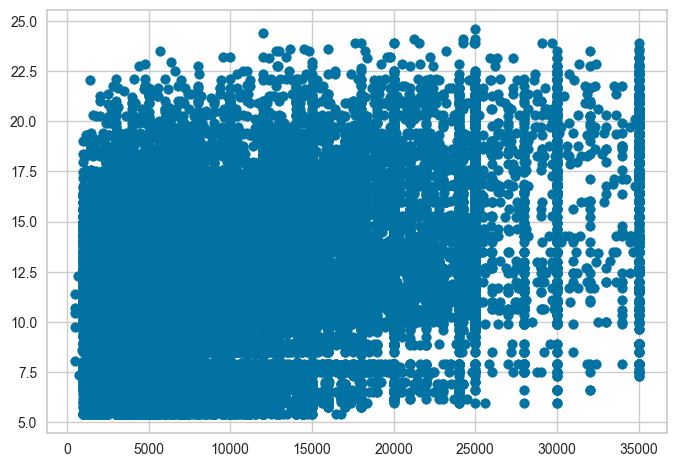

In [50]:
plt.scatter(df.loan_amnt,df.int_rate)

In [51]:
import plotly.express as px
fig = px.box(df, x="term", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [52]:
observed = df["purpose"].value_counts()
observed

debt_consolidation    18676
credit_card            5137
other                  4001
home_improvement       2985
major_purchase         2188
small_business         1831
car                    1551
wedding                 948
medical                 695
moving                  583
house                   382
vacation                381
educational             325
renewable_energy        103
Name: purpose, dtype: int64

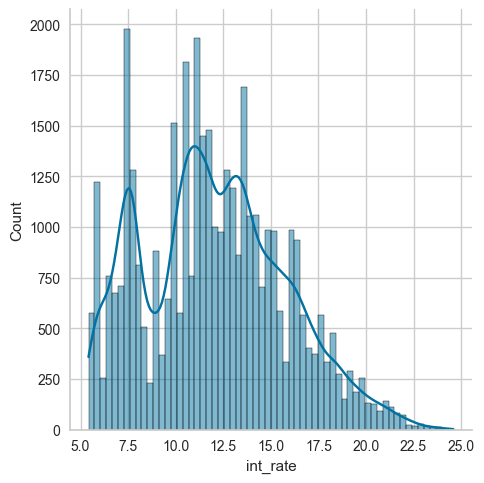

In [53]:
sns.displot(data=df, x="int_rate", kde=True)

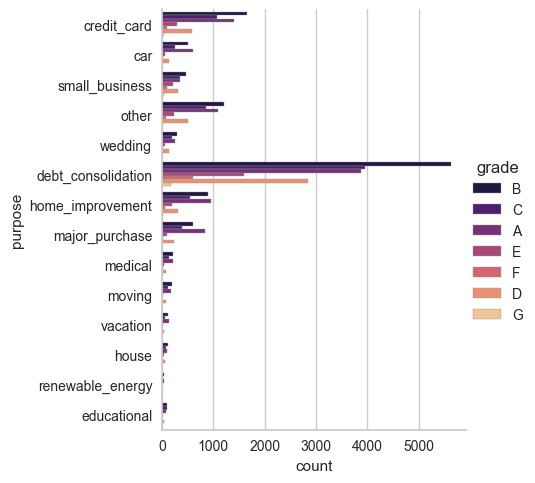

In [54]:

sns.catplot(
    data=df, y="purpose", hue="grade", kind="count",
    palette="magma", edgecolor=".6",
)

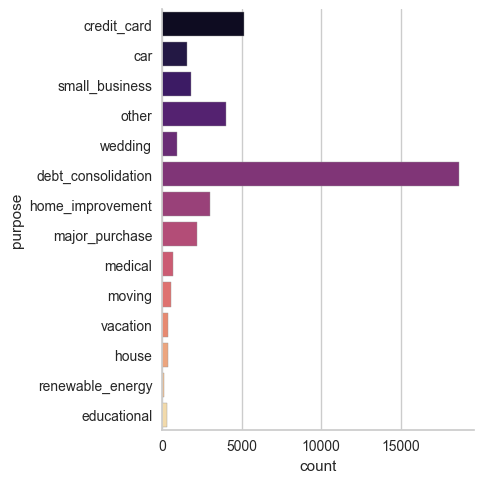

In [55]:
sns.catplot(
    data=df, y="purpose", kind="count",
    palette="magma", edgecolor=".6",
)

In [56]:
df.describe()

,int_rate,loan_amnt,term,annual_inc
count,39786.000000,39786.000000,39786.000000,3.978600e+04
mean,12.027873,11231.360277,42.448499,6.897907e+04
std,3.727466,7464.542832,10.638782,6.376263e+04
min,5.420000,500.000000,36.000000,4.000000e+03
25%,9.250000,5500.000000,36.000000,4.050000e+04
50%,11.860000,10000.000000,36.000000,5.900000e+04
75%,14.590000,15000.000000,60.000000,8.234250e+04
max,24.590000,35000.000000,60.000000,6.000000e+06


In [57]:
import plotly.express as px
fig = px.box(df, x="purpose", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [58]:
import plotly.express as px
fig = px.box(df, x="grade", y="int_rate")
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [59]:
import plotly.express as px

fig = px.box(df, x="purpose", y="int_rate", color="home_ownership")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [60]:

fig = px.box(df, x="purpose", y="int_rate", color="grade")
fig.update_traces(quartilemethod="exclusive") # or "inclusive", or "linear" by default
fig.show()

c:\ProgramData\Anaconda3\lib\site-packages\plotly\io\_renderers.py:396: DeprecationWarning:

distutils Version classes are deprecated. Use packaging.version instead.



In [61]:
## check binning and creating categorical data 

# Data Preparation

In [62]:
#Checking if there is any missing value in the data 
df.isna().any().any()

False

### creating spark session


In [64]:
import pyspark as ps

In [65]:
from pyspark.sql import SparkSession
from pyspark.ml.feature import StringIndexer

In [66]:
spark =SparkSession.builder.getOrCreate()

In [83]:
# File location and type
file_location = "LoanStats.csv"
file_type = "csv"

# CSV options
infer_schema = "false"
first_row_is_header = "true"
delimiter = ","

# The applied options are for CSV files. For other file types, these will be ignored.
df = spark.read.format(file_type) \
  .option("inferSchema", infer_schema) \
  .option("header", first_row_is_header) \
  .option("sep", delimiter) \
  .load(file_location)

display(df)

DataFrame[int_rate: string, loan_amnt: string, term: string, grade: string, home_ownership: string, annual_inc: string, purpose: string]

In [84]:
# Create a temporary table
df.createOrReplaceTempView("df")

In [73]:
spark.sql("select * from df ").show()

+--------+---------+----+-----+--------------+----------+------------------+
|int_rate|loan_amnt|term|grade|home_ownership|annual_inc|           purpose|
+--------+---------+----+-----+--------------+----------+------------------+
|   10.65|     5000|  36|    B|          RENT|     24000|       credit_card|
|   15.27|     2500|  60|    C|          RENT|     30000|               car|
|   15.96|     2400|  36|    C|          RENT|     12252|    small_business|
|   13.49|    10000|  36|    C|          RENT|     49200|             other|
|   12.69|     3000|  60|    B|          RENT|     80000|             other|
|    7.90|     5000|  36|    A|          RENT|     36000|           wedding|
|   15.96|     7000|  60|    C|          RENT|     47004|debt_consolidation|
|   18.64|     3000|  36|    E|          RENT|     48000|               car|
|   21.28|     5600|  60|    F|           OWN|     40000|    small_business|
|   12.69|     5375|  60|    B|          RENT|     15000|             other|

In [91]:
from pyspark.sql.types import IntegerType

In [96]:
# change the data type of int_rate, loan_amnt and annual_inc from string to integer
df=df.withColumn("int_rate",df["int_rate"].cast(IntegerType())).withColumn("loan_amnt",df["loan_amnt"].cast(IntegerType())).withColumn("annual_inc",df["annual_inc"].cast(IntegerType()))

In [97]:
df.printSchema()

root
 |-- int_rate: integer (nullable = true)
 |-- loan_amnt: integer (nullable = true)
 |-- term: string (nullable = true)
 |-- grade: string (nullable = true)
 |-- home_ownership: string (nullable = true)
 |-- annual_inc: integer (nullable = true)
 |-- purpose: string (nullable = true)



### Transform Categorical Data

In [86]:
from pyspark.ml.feature import StringIndexer

In [ ]:
## change wrong data type


In [79]:
df.

+--------+---------+----+-----+--------------+----------+------------------+
|int_rate|loan_amnt|term|grade|home_ownership|annual_inc|           purpose|
+--------+---------+----+-----+--------------+----------+------------------+
|   13.49|     3500|  36|    C|          RENT|     56000|debt_consolidation|
|   14.65|    10000|  36|    C|          RENT|     36000|       credit_card|
|   17.27|    10050|  60|    D|      MORTGAGE|  74143.68|  home_improvement|
|   20.30|    22750|  60|    E|      MORTGAGE|     47840|debt_consolidation|
|   16.29|     3625|  36|    D|          RENT|     19800|             other|
|   12.69|    24000|  60|    B|      MORTGAGE|    103000|debt_consolidation|
|    9.91|    10000|  36|    B|          RENT|    107000|debt_consolidation|
|    6.03|     6500|  36|    A|      MORTGAGE|     61650|             other|
|    6.03|     2500|  36|    A|           OWN|     48000|               car|
|    8.90|    12800|  60|    A|      MORTGAGE|     50400|debt_consolidation|